<a href="https://colab.research.google.com/github/janhavi-giri/Explainable_ML_Classifier_LIME/blob/main/LIME_Analysis_heart_failure_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#mapping drive and obtaining the data
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir('/content/drive/MyDrive/Colab Notebooks/ML_Projects/')
pwd = os.getcwd()
print(pwd)

Mounted at /content/drive
/content/drive/MyDrive/Colab Notebooks/ML_Projects


In [2]:
#import all the libraries
from scipy.io import loadmat,whosmat
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from numpy import reshape
import seaborn as sns
import sklearn
from sklearn.neighbors import NearestNeighbors
from sklearn import ensemble, cluster
from itertools import product
from sklearn.utils.validation import check_is_fitted


# Data pre-processing and visualization

In [3]:
# Read the data from csv file
df = pd.read_csv('heart_failure_clinical_records_dataset.csv')
print("# of features in dataset are =", df.shape[1])
print("# of samples in dataset are =", df.shape[0])
#List name of features
print("Features of data set are =", df.columns)
#List datatypes of features
print("Feature datatypes are=",df.dtypes)

# of features in dataset are = 13
# of samples in dataset are = 299
Features of data set are = Index(['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
       'ejection_fraction', 'high_blood_pressure', 'platelets',
       'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'time',
       'DEATH_EVENT'],
      dtype='object')
Feature datatypes are= age                         float64
anaemia                       int64
creatinine_phosphokinase      int64
diabetes                      int64
ejection_fraction             int64
high_blood_pressure           int64
platelets                   float64
serum_creatinine            float64
serum_sodium                  int64
sex                           int64
smoking                       int64
time                          int64
DEATH_EVENT                   int64
dtype: object


In [4]:
#Print first few rows of the input dataset
df.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


In [5]:
df.describe()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
count,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.00000,299.000000,299.000000,299.00000,299.000000,299.00000
mean,60.833893,0.431438,581.839465,0.418060,38.083612,0.351171,263358.029264,1.39388,136.625418,0.648829,0.32107,130.260870,0.32107
std,11.894809,0.496107,970.287881,0.494067,11.834841,0.478136,97804.236869,1.03451,4.412477,0.478136,0.46767,77.614208,0.46767
min,40.000000,0.000000,23.000000,0.000000,14.000000,0.000000,25100.000000,0.50000,113.000000,0.000000,0.00000,4.000000,0.00000
25%,51.000000,0.000000,116.500000,0.000000,30.000000,0.000000,212500.000000,0.90000,134.000000,0.000000,0.00000,73.000000,0.00000
50%,60.000000,0.000000,250.000000,0.000000,38.000000,0.000000,262000.000000,1.10000,137.000000,1.000000,0.00000,115.000000,0.00000
75%,70.000000,1.000000,582.000000,1.000000,45.000000,1.000000,303500.000000,1.40000,140.000000,1.000000,1.00000,203.000000,1.00000
max,95.000000,1.000000,7861.000000,1.000000,80.000000,1.000000,850000.000000,9.40000,148.000000,1.000000,1.00000,285.000000,1.00000


In [6]:
# Investigate the data set for any null values
for col in df.columns.to_list():
    print("Column", col, "Null value count=", df[col].isnull().sum())
    if(df[col].isnull().sum()!=0):
        print("Column has null count=",col, df[col].isnull().sum(), "and their datatype is",df[col].dtypes )

Column age Null value count= 0
Column anaemia Null value count= 0
Column creatinine_phosphokinase Null value count= 0
Column diabetes Null value count= 0
Column ejection_fraction Null value count= 0
Column high_blood_pressure Null value count= 0
Column platelets Null value count= 0
Column serum_creatinine Null value count= 0
Column serum_sodium Null value count= 0
Column sex Null value count= 0
Column smoking Null value count= 0
Column time Null value count= 0
Column DEATH_EVENT Null value count= 0


In [7]:
#splitting data: 80/20 split
from sklearn.model_selection import train_test_split
df_filt = df.drop(columns=['time'])
train, test = train_test_split(df_filt, test_size=0.2, random_state=25)

print(f"No. of training examples: {train.shape[0]}")
print(f"No. of testing examples: {test.shape[0]}")

No. of training examples: 239
No. of testing examples: 60


In [8]:
train_columns = train.columns.to_list()
test_columns = test.columns.to_list()
print("train columns=",train_columns,"test_columns=",test_columns)

train columns= ['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes', 'ejection_fraction', 'high_blood_pressure', 'platelets', 'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'DEATH_EVENT'] test_columns= ['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes', 'ejection_fraction', 'high_blood_pressure', 'platelets', 'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'DEATH_EVENT']


In [9]:
# scaling each column of the input features to mean zero and unit variance
scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train)
print(train_scaled.shape)
print(train_scaled[0:2,0])
test_scaled = scaler.fit_transform(test)
print(test_scaled.shape)
print(test_scaled[0:2,0])



(239, 12)
[0.76363636 0.54545455]
(60, 12)
[0.54 0.58]


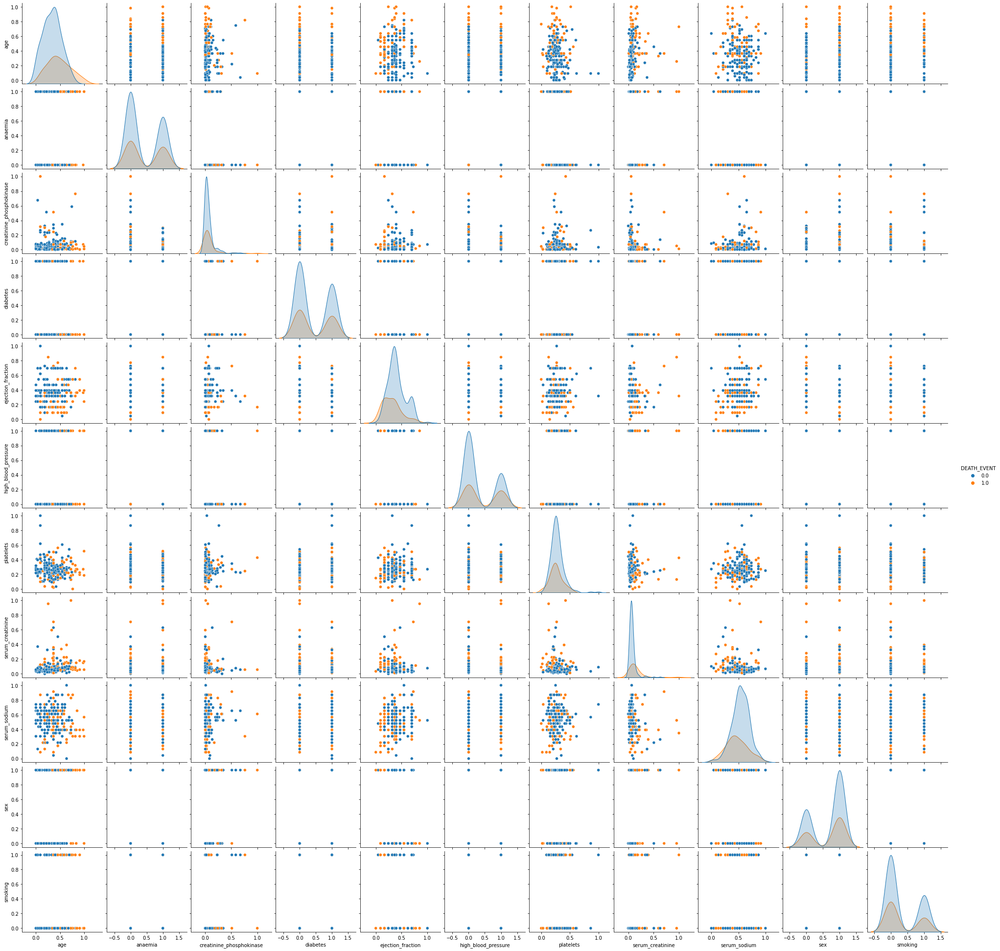

In [10]:
# Data visualization:
#Distribution of features in training dataset and how they are correlated among themselves
train_df_scaled = pd.DataFrame(train_scaled, columns=train_columns)
sns.pairplot(train_df_scaled,hue='DEATH_EVENT')

In [11]:
test_df_scaled = pd.DataFrame(test_scaled, columns=test_columns)

In [12]:
# input variables assigned and converted to numpy array(last column is the target therefore not picked)

X_train = (train_df_scaled.iloc[:,:-1].values)
print(X_train.shape)
X_test = (test_df_scaled.iloc[:,:-1].values)
print(X_test.shape)

(239, 11)
(60, 11)


In [13]:
# target variable assigned and converted to numpy array
Y_train = (train_df_scaled.iloc[:,-1].values).reshape((-1,1))
print("Shape of target in train dataset =", Y_train.shape)
Y_test = (test_df_scaled.iloc[:,-1].values).reshape((-1,1))
print("Shape of target in test dataset =", Y_test.shape)



Shape of target in train dataset = (239, 1)
Shape of target in test dataset = (60, 1)


In [14]:
# Inspect how balanced 'Y' is in the training
# computing fraction of positive values in target and test data
fraction_train = np.mean(Y_train)
fraction_test = np.mean(Y_test)
print("Percentage of positive values in training dataset target=", fraction_train*100.0)
print("Percentage of positive values in test dataset target=", fraction_test*100.0)

Percentage of positive values in training dataset target= 31.380753138075313
Percentage of positive values in test dataset target= 35.0


In [15]:
# It is an unbalanced dataset since the fraction of positive values << negative values => less likelihood of death

In [16]:
#checking if data is normalized

print(X_train.shape)
print(X_train[0:2,0])


print(X_test.shape)
print(X_test[0:2,0])


(239, 11)
[0.76363636 0.54545455]
(60, 11)
[0.54 0.58]


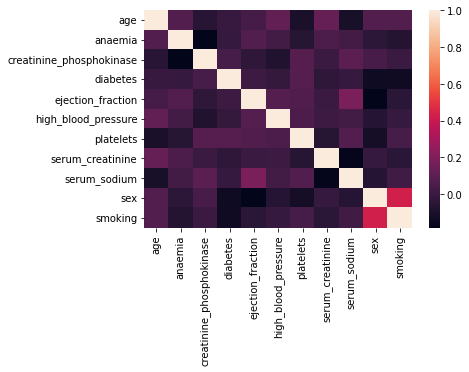

In [17]:
#not excluding time from analysis as the previous published result did
train_df_scaled_mod = train_df_scaled.drop(columns=['DEATH_EVENT'],axis=1)
test_df_scaled_mod = test_df_scaled.drop(columns=['DEATH_EVENT'],axis=1)
X_train_corr = train_df_scaled_mod.corr()
sns.heatmap(X_train_corr)
plt.show()

In [18]:
#Lets examine them and drop feature columns which have a high absolute Pearson Correlation i.e. >=0.6
keep_columns = np.full((X_train_corr.shape[0],), True, dtype=bool)
all_columns = train_df_scaled_mod.columns.to_list()
# Loop over all columns
for i in range(X_train_corr.shape[0]-1):
    # Loop over all columns to the right of the current one
    for j in range(i+1, X_train_corr.shape[0]-1):
        # If the absolute correlation between the current two columns is greater than or equal to 0.8, or no correlation 0 value...
        if (np.abs(X_train_corr.iloc[i,j]) >= 0.6):
            # If we haven't already told the keep_columns list to drop column j...
            if keep_columns[j]:
                # Drop column j
                keep_columns[j] = False
                print("Column to be dropped is =", all_columns[j], "correlated with column=", all_columns[i])
# Extract the columns to keep from the training df
selected_columns = train_df_scaled_mod.columns[keep_columns]
# Make a new df with the columns we've decided to keep from the training df
train_df_corr_filt = train_df_scaled_mod[selected_columns]

print('The following columns are present in the new data:')
print(selected_columns)
print(f'The old data had {train_df_scaled_mod.shape[1]} features. The new df has {train_df_corr_filt.shape[1]} features.')
train_df_corr_filt.head()

The following columns are present in the new data:
Index(['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
       'ejection_fraction', 'high_blood_pressure', 'platelets',
       'serum_creatinine', 'serum_sodium', 'sex', 'smoking'],
      dtype='object')
The old data had 11 features. The new df has 11 features.


,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking
0,0.763636,1.0,0.107534,1.0,0.545455,1.0,0.341220,0.056180,0.869565,0.0,0.0
1,0.545455,0.0,0.023723,1.0,0.045455,1.0,0.425903,0.056180,0.478261,1.0,1.0
2,0.454545,0.0,0.025287,1.0,0.545455,0.0,0.127024,0.089888,0.521739,1.0,1.0
3,0.000000,0.0,0.027894,0.0,0.469697,1.0,0.283935,0.044944,0.652174,0.0,0.0
4,0.454545,1.0,0.035845,0.0,0.166667,0.0,0.312578,0.067416,0.695652,1.0,0.0


# No strong correlation found among the given features

# Feature Selection using Random Forest Classifier

Feature ranking:
1. feature 7 (0.174806)
2. feature 0 (0.156311)
3. feature 4 (0.148431)
4. feature 8 (0.129224)
5. feature 6 (0.103435)
6. feature 2 (0.095514)
7. feature 3 (0.045915)
8. feature 9 (0.039339)
9. feature 10 (0.037470)
10. feature 5 (0.035136)
11. feature 1 (0.034417)


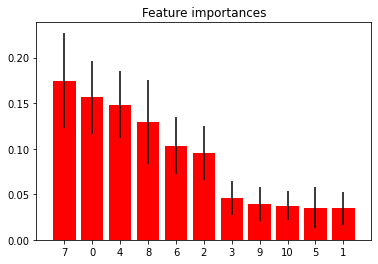

In [19]:
#Use Random Forest to get feature ranks/importances for each feature
from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier

# Build a forest and compute the impurity-based feature importances
forest = ExtraTreesClassifier(n_estimators=20,
                              random_state=0)

forest.fit(X_train, np.ravel(Y_train))
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(X_train.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices],
        color="r", yerr=std[indices], align="center")
plt.xticks(range(X_train.shape[1]), indices)
plt.xlim([-1, X_train.shape[1]])
plt.show()

In [20]:
print(f"Top 3 features ranked are {selected_columns[7]} with feature ranking {importances[7]}, {selected_columns[0]} with feature ranking {importances[0]}, and {selected_columns[4]} with feature ranking {importances[4]} ")
print(f"The lowest ranked feature is {selected_columns[1]} with feature ranking {importances[1]} ")

Top 3 features ranked are serum_creatinine with feature ranking 0.1748063573066016, age with feature ranking 0.15631141558586975, and ejection_fraction with feature ranking 0.14843072983707165 
The lowest ranked feature is anaemia with feature ranking 0.03441747466016304 


# Top 3 features ranked are serum_creatinine, age, and ejection_fraction. Thus, in order to determine whether there will be heart failure or not in a patient, these are the three most important features of the patient which need to be considered.

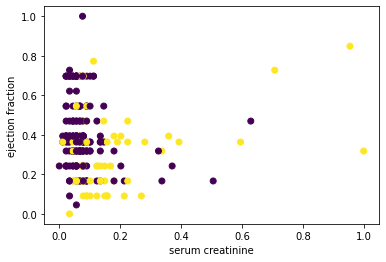

In [21]:
plt.scatter(X_train[:,7], X_train[:,4],c=Y_train[:])

plt.xlabel("serum creatinine")
plt.ylabel("ejection fraction")
plt.show()

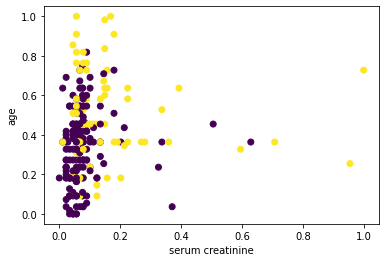

In [22]:
plt.scatter(X_train[:,7], X_train[:,0],c=Y_train[:])

plt.xlabel("serum creatinine")
plt.ylabel("age")
plt.show()

# LIME analysis of Classifier models

# Classifier models analyzed: Logistic Regression and Random Forest Classifier

#Logistic Regression Classifier

In [23]:
# Importing necessary libraries
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score as accuracy
from sklearn.metrics import recall_score as recall
from sklearn.metrics import precision_score as precision
from sklearn.metrics import f1_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
from sklearn import metrics

In [24]:
#Hyperparameter tuning for Logistic Regression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
pipe = Pipeline([('classifier', LogisticRegression())])
param_grid = {'classifier' : [LogisticRegression(random_state=42, class_weight='balanced')],
     'classifier__penalty' : ['l1', 'l2'],
    'classifier__C' : np.logspace(-4, 4, 20),
    'classifier__solver' : ['liblinear']}
# creating grid search object
clf = GridSearchCV(pipe, param_grid = param_grid, cv=5, verbose=True, n_jobs=-1)
#fit on data
best_clf_fit = clf.fit(train_df_scaled_mod.values, np.ravel(Y_train))
best_clf_predict = best_clf_fit.predict(test_df_scaled_mod.values)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    1.6s finished


In [25]:
lr_model = best_clf_fit.best_params_['classifier']

In [26]:
from sklearn import metrics
print('Model accuracy is',best_clf_fit.score(test_df_scaled_mod.values, Y_test))

Model accuracy is 0.7166666666666667


Accuracy = 0.7166666666666667, Precision = 0.5833333333333334, Recall = 0.6666666666666666, F1-score = 0.6222222222222222
Confusion Matrix is:
[[29 10]
 [ 7 14]]


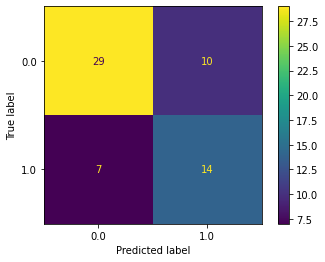

In [27]:
#Evaluate predictions
cmlog = confusion_matrix(Y_test, best_clf_predict)
acc   = accuracy(Y_test, best_clf_predict)
rec   = recall(Y_test, best_clf_predict)
prec  = precision(Y_test, best_clf_predict)
f1    = f1_score(Y_test, best_clf_predict)
# Print the metrics, display the confusion matrix
print(f'Accuracy = {acc}, Precision = {prec}, Recall = {rec}, F1-score = {f1}')
print('Confusion Matrix is:')
print(cmlog)
plot_confusion_matrix(best_clf_fit,test_df_scaled_mod.values,Y_test)
plt.show()

In [28]:
print(metrics.classification_report(Y_test,best_clf_predict))

              precision    recall  f1-score   support

         0.0       0.81      0.74      0.77        39
         1.0       0.58      0.67      0.62        21

    accuracy                           0.72        60
   macro avg       0.69      0.71      0.70        60
weighted avg       0.73      0.72      0.72        60



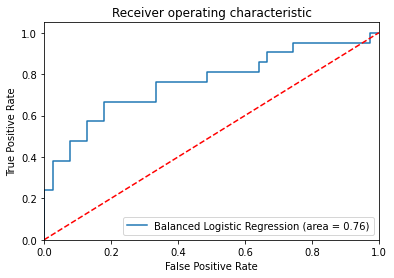

In [29]:
probs = best_clf_fit.predict_proba(test_df_scaled_mod.values)
preds = probs[:,1]

fpr, tpr, threshold = metrics.roc_curve(Y_test, preds)
roc_auc_hyp_fit = metrics.auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='Balanced Logistic Regression (area = %0.2f)' % roc_auc_hyp_fit)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [30]:
print('With hyperparameter tuning the roc_auc=',roc_auc_hyp_fit)

With hyperparameter tuning the roc_auc= 0.7606837606837608


In [31]:
print("With hyperparameter tuning the model accuracy is:", best_clf_fit.score(test_df_scaled_mod.values,Y_test))

With hyperparameter tuning the model accuracy is: 0.7166666666666667


In [32]:
data = {
    'accuracy': [accuracy(Y_test, best_clf_predict)],
    'precision': [precision(Y_test, best_clf_predict)],
    'recall': [recall(Y_test,best_clf_predict)],
    'f1 score': [f1_score(Y_test, best_clf_predict)]
}
print("Logistic Regression Results")
pd.DataFrame.from_dict(data, orient='index', columns=[' LR_ tuned'])

Logistic Regression Results


,LR_ tuned
accuracy,0.716667
precision,0.583333
recall,0.666667
f1 score,0.622222


In [33]:
#Using LIME 
!pip install shap
!pip install lime
!pip install eli5

     |████████████████████████████████| 356 kB 5.0 MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491642 sha256=c796948959a535b350baa5e99509f69e019aefe847b4b7980351c5201c7243a4
  Stored in directory: /root/.cache/pip/wheels/ca/25/8f/6ae5df62c32651cd719e972e738a8aaa4a87414c4d2b14c9c0
Successfully built shap
     |████████████████████████████████| 275 kB 5.2 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=3367732b623080423617b85d3530152bfcc463a16fa7afb0fd924385ec719f7f
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime
     |████████████████████████████████| 106 kB 5.1 MB/s 


In [34]:
#eli5 package (https://eli5.readthedocs.io/en/latest)
import eli5
from eli5.sklearn import PermutationImportance

#lime package (https://github.com/marcotcr/lime)
import lime
import lime.lime_tabular

#shap package (https://github.com/slundberg/shap)
import shap

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


# LIME for Logistic Regression Classifier

In [75]:
#Explain samples in test set (11 features) for positive prediction
def explain_lime(model,indx):
  RANDOM_STATE = 123
  model_fit = model.fit(train_df_scaled_mod.values, np.ravel(Y_train))
  X_explain = test_df_scaled_mod
  explainer = lime.lime_tabular.LimeTabularExplainer(training_data=train_df_scaled_mod.values,
                                                   feature_names=train_df_scaled_mod.columns.values,
                                                   discretize_continuous=True,
                                                   class_names=["alive", "dead"],
                                                   mode="classification",
                                                   verbose=True,
                                                   random_state=RANDOM_STATE)

  #Explaining first subject in test set using all 11 features
  exp = explainer.explain_instance(X_explain.values[indx,:],model_fit.predict_proba, 
                                 num_features=11)
  # coefficients
  exp_coeff = pd.DataFrame(exp.as_list())
  print("coefficients are", exp_coeff)
  sum_lime_coeff = pd.DataFrame(exp.as_list())[1].sum()
  #Lime model prediction: Intercept + sum of coeff
  lime_pred = sum_lime_coeff + exp.intercept[1]
  print("Lime prediction is", lime_pred)
  #Plot local explanation
  plt = exp.as_pyplot_figure()
  plt.tight_layout()
  exp.show_in_notebook(show_table=True)

  


In [54]:
# Determining indices with positive predictions
lr_model_fit = lr_model.fit(train_df_scaled_mod.values,np.ravel(Y_train))
lr_model_predict_1 = np.where(lr_model_fit.predict(test_df_scaled_mod.values)==1)
print(lr_model_predict_1)
lr_model_predict_0 = np.where(lr_model_fit.predict(test_df_scaled_mod.values)==0)
print(lr_model_predict_0)

(array([ 2,  5,  6,  7,  8,  9, 14, 17, 18, 19, 22, 23, 27, 31, 32, 33, 38,
       39, 41, 45, 47, 49, 53, 54]),)
(array([ 0,  1,  3,  4, 10, 11, 12, 13, 15, 16, 20, 21, 24, 25, 26, 28, 29,
       30, 34, 35, 36, 37, 40, 42, 43, 44, 46, 48, 50, 51, 52, 55, 56, 57,
       58, 59]),)


In [56]:
# Actual prediction
for i in lr_model_predict_1:
  print(Y_test[i])


[[0.]
 [1.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [1.]
 [0.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [0.]
 [1.]
 [1.]
 [0.]
 [1.]
 [1.]
 [0.]
 [1.]
 [0.]
 [1.]]


In [57]:
for j in lr_model_predict_0:
  print(Y_test[j])

[[0.]
 [0.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [1.]
 [0.]
 [1.]
 [0.]
 [1.]]


# True Positive prediction:  death event

Actual prediction [1.]
Intercept 0.26067818565015954
Prediction_local [0.98658465]
Right: 0.683117620418622
coefficients are                                           0         1
0                   serum_creatinine > 0.10  0.277888
1                 ejection_fraction <= 0.24  0.234716
2        0.00 < high_blood_pressure <= 1.00  0.127265
3                       serum_sodium > 0.65 -0.062614
4                               sex <= 0.00  0.059315
5                        0.36 < age <= 0.54  0.049636
6                    0.00 < anaemia <= 1.00  0.047265
7                   0.00 < diabetes <= 1.00  0.044746
8                          platelets > 0.32 -0.027205
9                           smoking <= 0.00 -0.020257
10  0.03 < creatinine_phosphokinase <= 0.07 -0.004849
Lime prediction is 0.9865846490272259


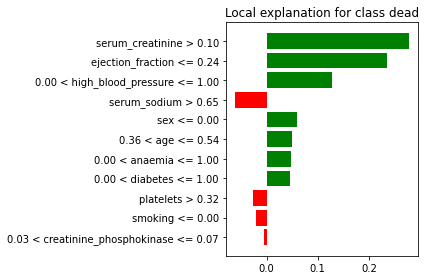

In [76]:
#for positive prediction: sample# 54
print("Actual prediction", Y_test[54])
explain_lime(lr_model,54)


In [45]:
# Actual prediction
Y_test[54]

array([1.])

# Green/Red color: features that have positive correlations with the target are shown in green, otherwise red. 
# For sample \# 54, the serum creatinine, ejection fraction, and high blood pressure positively correlate with positive death event. Major contributors  creatinine levels, ejection fraction, and high blood pressure are clear indicators that the patient will suffer a death event. The prediction agrees with the actual prediction which is positive.

# True Negative prediction: No death event

Actual prediction [0.]
Intercept 0.541192962160397
Prediction_local [0.63240838]
Right: 0.3329993663274309
coefficients are                                   0         1
0                        age > 0.54  0.283081
1           serum_creatinine > 0.10  0.271129
2          ejection_fraction > 0.47 -0.268962
3       high_blood_pressure <= 0.00 -0.114611
4   creatinine_phosphokinase > 0.07  0.090530
5               serum_sodium > 0.65 -0.066095
6                0.00 < sex <= 1.00 -0.058791
7                   anaemia <= 0.00 -0.048390
8                  diabetes <= 0.00 -0.037463
9            0.00 < smoking <= 1.00  0.022804
10                platelets <= 0.21  0.017985
Lime prediction is 0.6324083842533689


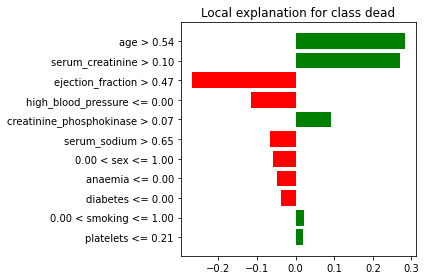

In [77]:
#for negative prediction
print("Actual prediction", Y_test[1])
explain_lime(lr_model,1)

In [48]:
# actual negative 
Y_test[1]

array([0.])

# For this case, the patient has higher serum creatinine levels and also falls in the age that correlates positively with the 'positive' death event. However, the ejection fraction has also similar correlation but with 'negative' death event along with contributions from other parameters such as high blood presssure therefore, the model predicts that it would not lead to death. The prediction agrees with the actual prediction which is negative. 

#Thus, using LIME we are able to explain why the model predicts that a given case will lead to a death event and what are the crucial parameters responsbile for resulting in a death event. 


# False positive i.e. incorrect prediction of positive death event due to heart failure by the model

Actual prediction [0.]
Intercept 0.39597852327965644
Prediction_local [0.58211989]
Right: 0.573358253834622
coefficients are                                      0         1
0             ejection_fraction > 0.47 -0.275355
1              serum_creatinine > 0.10  0.269018
2   0.00 < high_blood_pressure <= 1.00  0.120895
3                  serum_sodium > 0.65 -0.060696
4                          sex <= 0.00  0.057925
5                   0.36 < age <= 0.54  0.048237
6               0.00 < anaemia <= 1.00  0.046868
7              0.00 < diabetes <= 1.00  0.042727
8     creatinine_phosphokinase <= 0.01 -0.040081
9                      smoking <= 0.00 -0.022681
10            0.21 < platelets <= 0.27 -0.000717
Lime prediction is 0.5821198942424719


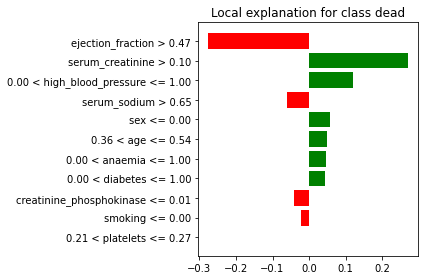

In [78]:
#for false positive prediction: sample# 2
print("Actual prediction", Y_test[2])
explain_lime(lr_model,2)

# Explaination of False Positive Result from LIME:
# Even though the ejection fraction is high but since the creatinine levels are also high (in the range of 'dead' class) the model predicts that it will result in death

# False negative i.e. incorrect prediction of No death event due to heart failure by the model

Actual prediction [1.]
Intercept 0.5632512795164707
Prediction_local [0.46907007]
Right: 0.4540600038690418
coefficients are                                    0         1
0          ejection_fraction <= 0.24  0.232817
1           serum_creatinine <= 0.04 -0.125956
2        high_blood_pressure <= 0.00 -0.122646
3                serum_sodium > 0.65 -0.054959
4                 0.00 < sex <= 1.00 -0.053919
5             0.00 < anaemia <= 1.00  0.048302
6                 0.36 < age <= 0.54  0.046614
7                   diabetes <= 0.00 -0.045510
8   creatinine_phosphokinase <= 0.01 -0.041304
9             0.00 < smoking <= 1.00  0.016830
10          0.27 < platelets <= 0.32  0.005549
Lime prediction is 0.46907007087688635


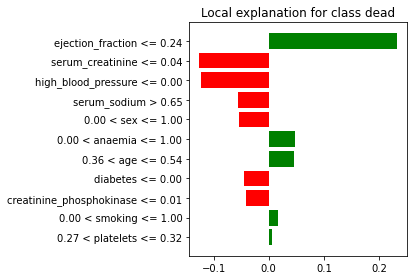

In [79]:
#for false negative prediction: sample# 10
print("Actual prediction", Y_test[10])
explain_lime(lr_model,10)

# Explanation of False Negative Result from LIME: 
# Even though the ejection fraction is low but since the creatinine levels are low (in the range of 'alive' class) the model predicts that it will not result in death

# Random Forest Classifier

In [62]:
from sklearn.ensemble import RandomForestClassifier


In [63]:
#Hyperparameter tuning for Random Forest Classifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
pipe = Pipeline([('classifier', RandomForestClassifier())])
param_grid = {'classifier' : [RandomForestClassifier(random_state=42, class_weight='balanced')],
    'classifier__criterion' : ["gini","entropy"],
     'classifier__max_depth' : [2,5,10]
    }
# creating grid search object
clf = GridSearchCV(pipe, param_grid = param_grid, cv=5, verbose=True, n_jobs=-1)
#fit on data
best_clf_fit = clf.fit(train_df_scaled_mod.values,np.ravel(Y_train))
best_clf_predict = best_clf_fit.predict(test_df_scaled_mod.values)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    5.6s finished


In [64]:
rf_model = best_clf_fit.best_params_['classifier']

Accuracy = 0.6833333333333333, Precision = 0.53125, Recall = 0.8095238095238095, F1-score = 0.6415094339622642
Confusion Matrix is:
[[24 15]
 [ 4 17]]


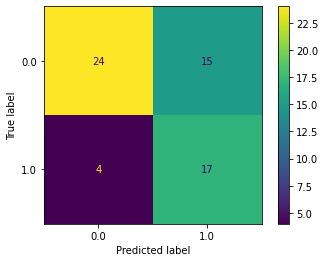

In [66]:
#Evaluate predictions
cmlog = confusion_matrix(Y_test, best_clf_predict)
acc   = accuracy(Y_test, best_clf_predict)
rec   = recall(Y_test, best_clf_predict)
prec  = precision(Y_test, best_clf_predict)
f1    = f1_score(Y_test, best_clf_predict)
# Print the metrics, display the confusion matrix
print(f'Accuracy = {acc}, Precision = {prec}, Recall = {rec}, F1-score = {f1}')
print('Confusion Matrix is:')
print(cmlog)
plot_confusion_matrix(best_clf_fit,test_df_scaled_mod.values,Y_test)
plt.show()

In [67]:
print(metrics.classification_report(Y_test,best_clf_predict))

              precision    recall  f1-score   support

         0.0       0.86      0.62      0.72        39
         1.0       0.53      0.81      0.64        21

    accuracy                           0.68        60
   macro avg       0.69      0.71      0.68        60
weighted avg       0.74      0.68      0.69        60



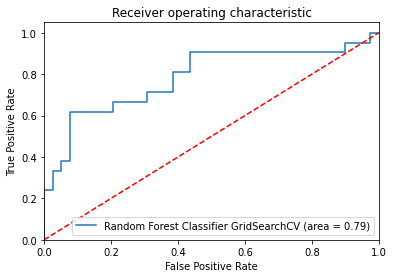

In [68]:
# ROC/AUC for positive class
probs = best_clf_fit.predict_proba(test_df_scaled_mod.values)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(Y_test, preds)
roc_auc_hyp_fit = metrics.auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label='Random Forest Classifier GridSearchCV (area = %0.2f)' % roc_auc_hyp_fit)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [69]:
# Determining indices with positive predictions
rf_model_fit = rf_model.fit(train_df_scaled_mod.values,np.ravel(Y_train))
rf_model_predict_1 = np.where(rf_model_fit.predict(test_df_scaled_mod.values)==1)
print(rf_model_predict_1)
rf_model_predict_0 = np.where(rf_model_fit.predict(test_df_scaled_mod.values)==0)
print(rf_model_predict_0)

(array([ 0,  4,  5,  6,  7,  8,  9, 12, 13, 14, 15, 17, 19, 22, 23, 26, 27,
       28, 31, 32, 33, 38, 39, 40, 41, 45, 49, 50, 52, 53, 54, 59]),)
(array([ 1,  2,  3, 10, 11, 16, 18, 20, 21, 24, 25, 29, 30, 34, 35, 36, 37,
       42, 43, 44, 46, 47, 48, 51, 55, 56, 57, 58]),)


In [85]:
# to determine false positives
for i in rf_model_predict_1:
  print(Y_test[i])

[[0.]
 [0.]
 [1.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [1.]
 [0.]
 [0.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [0.]
 [1.]
 [1.]]


In [88]:
# to determine false negatives
for i in rf_model_predict_0:
  print(Y_test[i])

[[0.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [1.]
 [0.]
 [1.]
 [0.]]


# LIME for Random Forest Classifier

# True Positive Prediction: death event

Actual prediction [1.]
Intercept 0.3957264683652135
Prediction_local [0.67895353]
Right: 0.5051689279947661
coefficients are                                           0         1
0                   serum_creatinine > 0.10  0.205058
1                 ejection_fraction <= 0.24  0.061204
2        0.00 < high_blood_pressure <= 1.00  0.016583
3                       serum_sodium > 0.65 -0.014254
4   0.03 < creatinine_phosphokinase <= 0.07  0.010268
5                   0.00 < diabetes <= 1.00  0.003326
6                        0.36 < age <= 0.54  0.002196
7                          platelets > 0.32 -0.001479
8                               sex <= 0.00 -0.001022
9                    0.00 < anaemia <= 1.00  0.000917
10                          smoking <= 0.00  0.000431
Lime prediction is 0.6789535250341807


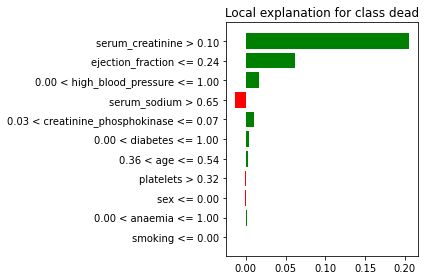

In [81]:
print("Actual prediction", Y_test[54])
explain_lime(rf_model,54)

# Serum creatinine is high and ejection fraction is low, both coorelate positively with the target which therefore leads to a positive prediction.

# Ture Negative Prediction: No death event

Actual prediction [0.]
Intercept 0.48642000641788474
Prediction_local [0.38701814]
Right: 0.40261953506549425
coefficients are                                      0         1
0      0.04 < serum_creatinine <= 0.07 -0.047338
1             ejection_fraction > 0.47 -0.043828
2     creatinine_phosphokinase <= 0.01 -0.026238
3   0.00 < high_blood_pressure <= 1.00  0.016312
4                  serum_sodium > 0.65 -0.013035
5              0.00 < diabetes <= 1.00  0.005236
6                   0.00 < sex <= 1.00  0.004485
7                      smoking <= 0.00  0.002947
8               0.00 < anaemia <= 1.00  0.002233
9                     platelets > 0.32 -0.000696
10                  0.36 < age <= 0.54  0.000521
Lime prediction is 0.3870181410030569


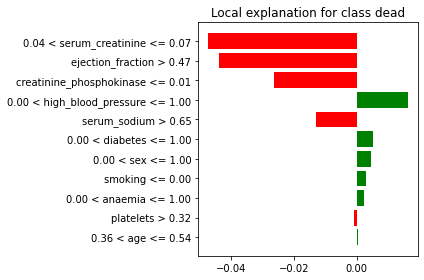

In [92]:
print("Actual prediction", Y_test[3])
explain_lime(rf_model,3)


# Serum creatinine is low and ejection fraction is high, both coorelate negatively with the target which therefore leads to a negative prediction. 

# False positive i.e. death event due to heart failure as predicted by the model but in reality heart failure does not lead to a death event

Actual prediction [0.]
Intercept 0.44780728331413117
Prediction_local [0.56820525]
Right: 0.5911516655470064
coefficients are                                           0             1
0                   serum_creatinine > 0.10  2.037049e-01
1                  ejection_fraction > 0.47 -3.818287e-02
2                        0.22 < age <= 0.36 -2.285940e-02
3               high_blood_pressure <= 0.00 -1.549817e-02
4                       serum_sodium > 0.65 -1.362300e-02
5   0.01 < creatinine_phosphokinase <= 0.03  9.926545e-03
6                          diabetes <= 0.00 -3.089045e-03
7                        0.00 < sex <= 1.00  1.419379e-03
8                          platelets > 0.32 -1.011629e-03
9                    0.00 < anaemia <= 1.00 -3.895392e-04
10                   0.00 < smoking <= 1.00  7.739946e-07
Lime prediction is 0.5682052514474654


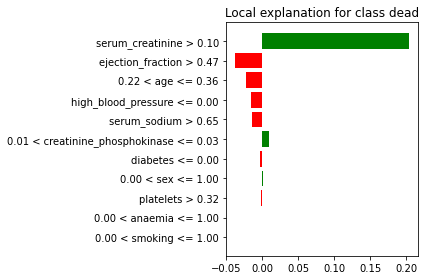

In [87]:
#for false positive prediction: sample# 4
print("Actual prediction", Y_test[4])
explain_lime(rf_model,4)

# Serum creatinine is the major contributor, correlates positively with the target feature and therefore is predicted by the model as positive death event.

# False negative i.e. no death event due to heart failure as predicted by the model but in reality heart failure leads to death event

Actual prediction [1.]
Intercept 0.501865317861097
Prediction_local [0.3813951]
Right: 0.3651336297006331
coefficients are                                    0         1
0           serum_creatinine <= 0.04 -0.119324
1          ejection_fraction <= 0.24  0.059250
2   creatinine_phosphokinase <= 0.01 -0.026138
3        high_blood_pressure <= 0.00 -0.013423
4                serum_sodium > 0.65 -0.010980
5           0.27 < platelets <= 0.32 -0.007460
6                   diabetes <= 0.00 -0.005519
7                 0.00 < sex <= 1.00  0.004813
8             0.00 < smoking <= 1.00 -0.003102
9                 0.36 < age <= 0.54  0.000831
10            0.00 < anaemia <= 1.00  0.000580
Lime prediction is 0.381395102003801


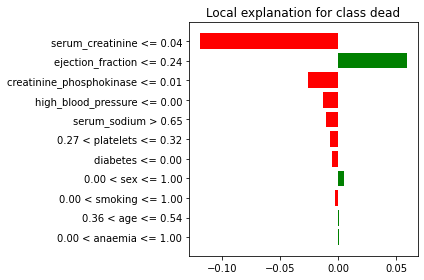

In [89]:
#for false negative prediction: sample# 10
print("Actual prediction", Y_test[10])
explain_lime(rf_model,10)

# Serum creatinine levels are low, coorelates negatively and is major contributor compared to ejection fraction which even though is low causes the model to predict it as a negative death event.

# For obtaining list of imported libraries and env settings

In [90]:
!pip freeze


absl-py==0.12.0
alabaster==0.7.12
albumentations==0.1.12
altair==4.1.0
appdirs==1.4.4
argcomplete==1.12.3
argon2-cffi==21.1.0
arviz==0.11.4
astor==0.8.1
astropy==4.3.1
astunparse==1.6.3
atari-py==0.2.9
atomicwrites==1.4.0
attrs==21.2.0
audioread==2.1.9
autograd==1.3
Babel==2.9.1
backcall==0.2.0
beautifulsoup4==4.6.3
bleach==4.1.0
blis==0.4.1
bokeh==2.3.3
Bottleneck==1.3.2
branca==0.4.2
bs4==0.0.1
CacheControl==0.12.6
cached-property==1.5.2
cachetools==4.2.4
catalogue==1.0.0
certifi==2021.5.30
cffi==1.14.6
cftime==1.5.1
chardet==3.0.4
charset-normalizer==2.0.6
clang==5.0
click==7.1.2
cloudpickle==1.3.0
cmake==3.12.0
cmdstanpy==0.9.5
colorcet==2.0.6
colorlover==0.3.0
community==1.0.0b1
contextlib2==0.5.5
convertdate==2.3.2
coverage==3.7.1
coveralls==0.5
crcmod==1.7
cufflinks==0.17.3
cvxopt==1.2.7
cvxpy==1.0.31
cycler==0.10.0
cymem==2.0.5
Cython==0.29.24
daft==0.0.4
dask==2.12.0
datascience==0.10.6
debugpy==1.0.0
decorator==4.4.2
defusedxml==0.7.1
descartes==1.1.0
dill==0.3.4
distributed=

In [91]:
import types

def imports():
    for name, val in globals().items():
        if isinstance(val, types.ModuleType):
            yield val.__name__

list(imports())

['builtins',
 'builtins',
 'IPython.core.shadowns',
 'google.colab.drive',
 'os',
 'numpy',
 'pandas',
 'matplotlib.pyplot',
 'seaborn',
 'sklearn',
 'sklearn.ensemble',
 'sklearn.cluster',
 'sklearn.metrics',
 'eli5',
 'lime',
 'shap',
 'types']